subnet resize

In [4]:
#install dependencies
# !pip install pandas
!pip install folium

   ---------------------------------------- 0.0/113.4 kB ? eta -:--:--
   ---------------------------------------- 113.4/113.4 kB 3.3 MB/s eta 0:00:00
   ---------------------------------------- 0.0/134.9 kB ? eta -:--:--
   ---------------------------------------- 134.9/134.9 kB 7.8 MB/s eta 0:00:00
   ---------------------------------------- 0.0/90.4 kB ? eta -:--:--
   ---------------------------------------- 90.4/90.4 kB 5.0 MB/s eta 0:00:00



[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


step1-Read a dataset and print out the unique taxis

In [44]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("D:/Research/Papers/repo/IEEE_SubResizeUsingAIForFleetVehicles/data/taxi_data_merged.csv")

# Inspect
print(df.head())
print(df['taxiid'].nunique(), "unique taxis")


   taxiid            timestamp  longitude  latitude
0    6211  2008-02-02 13:30:49  116.35278  39.98036
1    6211  2008-02-02 13:30:54  116.35279  39.98036
2    6211  2008-02-02 13:30:59  116.35279  39.98037
3    6211  2008-02-02 13:31:04  116.35280  39.98036
4    6211  2008-02-02 13:31:09  116.35280  39.98037
497 unique taxis


### Lets Repeat this step to identify all the outliers from all the taxi

In [50]:
# 1. Define valid GPS bounds for China
lat_range = (18.15, 53.55)
lon_range = (73.50, 134.77)

# 2. Filter all out-of-bound GPS points
gps_outliers = df[
    (~df['latitude'].between(*lat_range)) |
    (~df['longitude'].between(*lon_range))
]

# 3. Show how many and a sample
print(f"Total GPS points: {len(df)}")
print(f"Out-of-bounds GPS entries: {len(gps_outliers)}")

# 4. Display a few rows of the outlier data
gps_outliers[['taxiid', 'timestamp', 'latitude', 'longitude']].head(10)

Total GPS points: 1027004
Out-of-bounds GPS entries: 465


,taxiid,timestamp,latitude,longitude
3035,6211,2008-02-03 06:26:56,0.0,0.0
3036,6211,2008-02-03 06:27:00,0.0,0.0
3037,6211,2008-02-03 06:27:05,0.0,0.0
3038,6211,2008-02-03 06:27:10,0.0,0.0
3039,6211,2008-02-03 06:27:15,0.0,0.0
3040,6211,2008-02-03 06:27:20,0.0,0.0
3041,6211,2008-02-03 06:27:25,0.0,0.0
3042,6211,2008-02-03 06:27:30,0.0,0.0
3043,6211,2008-02-03 06:27:35,0.0,0.0
3044,6211,2008-02-03 06:27:40,0.0,0.0


To remove the outliers (i.e., drop rows outside your valid GPS range) from your DataFrame, you can invert the filter condition and keep only rows within the bounds.

Here’s how to do it step-by-step:

✅ Step 1: Define valid China GPS bounds

In [51]:
lat_range = (18.15, 53.55)
lon_range = (73.50, 134.77)

✅ Step 2: Filter the DataFrame to only keep valid rows

In [52]:
df_cleaned = df[
    df['latitude'].between(*lat_range) &
    df['longitude'].between(*lon_range)
]

✅ Step 3: (Optional) Confirm cleaning

In [53]:
print(f"Original GPS points: {len(df)}")
print(f"Cleaned GPS points: {len(df_cleaned)}")
print(f"Removed outliers: {len(df) - len(df_cleaned)}")

Original GPS points: 1027004
Cleaned GPS points: 1026539
Removed outliers: 465


## Plot trajectories of 1 or more taxis on an interactive map with legend.

In [54]:
import pandas as pd
import folium
import random
from branca.element import MacroElement
from jinja2 import Template

def plot_taxi_trajectories(df_cleaned, taxi_ids=None, n_samples=2):
    """
    Plot trajectories of 1 or more taxis on an interactive map with legend.

    Parameters:
        df_cleaned (pd.DataFrame): Must contain ['taxiid', 'timestamp', 'latitude', 'longitude'].
        taxi_ids (list[int], optional): List of taxi IDs to plot. If None, selects n_samples randomly.
        n_samples (int): Number of taxis to sample randomly if taxi_ids is not provided.

    Returns:
        folium.Map: Interactive map with plotted trajectories.
    """
    
    # Choose taxi IDs
    if taxi_ids is None:
        taxi_ids = random.sample(df['taxiid'].unique().tolist(), n_samples)
    
    # Define some distinct colors
    colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown']
    colors = (colors * ((len(taxi_ids) // len(colors)) + 1))[:len(taxi_ids)]
    
    # Initialize base map
    m = folium.Map(
        location=[df['latitude'].median(), df['longitude'].median()],
        zoom_start=12,
        tiles='CartoDB positron',
        width="100%", height="600px"
    )
    
    # Legend HTML setup
    legend_items = []
    
    for taxi_id, color in zip(taxi_ids, colors):
        sub = df[df['taxiid'] == taxi_id].sort_values('timestamp')
        coords = sub[['latitude', 'longitude']].values.tolist()
        
        # Plot polyline (trajectory)
        folium.PolyLine(
            coords,
            color=color,
            weight=3,
            opacity=0.7,
            tooltip=f"Taxi {taxi_id}"
        ).add_to(m)
        
        # Plot individual points with timestamp popups
        for _, row in sub.iterrows():
            folium.CircleMarker(
                location=[row['latitude'], row['longitude']],
                radius=2,
                color=color,
                fill=True,
                fill_opacity=0.7,
                popup=str(row['timestamp'])
            ).add_to(m)
        
        legend_items.append((taxi_id, color))
    
    # Add legend to map
    legend_html = """
    {% macro html(this, kwargs) %}
    <div style="
        position: fixed; bottom: 20px; left: 20px; z-index:9999;
        background-color: white; padding: 10px; border:2px solid grey;
        box-shadow: 2px 2px 5px rgba(0,0,0,0.3); font-size: 14px;">
      <b>Taxi IDs</b><br>
      {% for taxi_id, color in this.legend_items %}
        <i style="background:{{ color }};width:12px;height:12px;
                 float:left;margin-right:6px;opacity:0.85"></i>{{ taxi_id }}<br>
      {% endfor %}
    </div>
    {% endmacro %}
    """
    legend = MacroElement()
    legend._template = Template(legend_html)
    legend.legend_items = legend_items
    m.get_root().add_child(legend)

    return m

m = plot_taxi_trajectories(df)

display

In [55]:
# Display the map
m

Step 2: Plot All Taxi Locations (Scatter Plot)

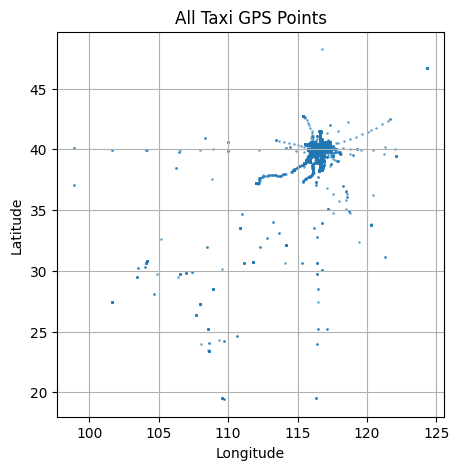

In [56]:
plt.figure(figsize=(5, 5))
plt.scatter(df_cleaned['longitude'], df_cleaned['latitude'], s=1, alpha=0.5)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("All Taxi GPS Points")
plt.grid(True)
plt.show()

Step3-Plot All GPS Points on a Map


In [58]:
import pandas as pd
import folium
from IPython.display import display

# Load your taxi data
# df = pd.read_csv("taxi_data_merged.csv")

# Downsample if needed
df_sample = df_cleaned.sample(n=10000)  # Or skip this line to use all points

# Create map centered on average location
m = folium.Map(location=[df_sample['latitude'].mean(), df_sample['longitude'].mean()],
               zoom_start=12, tiles='CartoDB positron')
# Collect all coordinates to define bounds
bounds = []
# min_lat, max_lat = df_sample['latitude'].min(), df_sample['latitude'].max()
# min_lon, max_lon = df_sample['longitude'].min(), df_sample['longitude'].max()

# Add GPS points as circle markers
for _, row in df_sample.iterrows():
    lat = row['latitude'],
    lon = row['longitude'],
    bounds.append([lat, lon]) # Collect for fit_bounds()
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],

        width=600,
        height=400,
        radius=1,
        color='blue',
        fill=True,
        fill_opacity=0.5
    ).add_to(m)
# Zoom to fit all the plotted points
m.fit_bounds(bounds)

# 👉 Display map inline in Jupyter Notebook
display(m)
